In [1]:
import sys
import os
from typing import Optional
from tqdm import tqdm
sys.path.append(os.path.abspath('../'))

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import seaborn as sns
import os
from IPython.display import display, HTML

from utils import *
from utils.plot_utils import *

pd.set_option('display.max_rows', 500)

In [2]:
names_to_labels={
    'truthfulqa-truthful_qa':"TruthfulQA", 
    'cais-mmlu':"MMLU", 
    'allenai-ai2_arc-ARC-Easy':"ARC Easy", 
    'lucasmccabe-logiqa':"LogiQA", 
    'allenai-ai2_arc-ARC-Challenge':"ARC Challenge", 
    'competition_math' : "MATH", 
    'deepmind-aqua_rat' : "AQUA-RAT"
    
}

date = "12-05-2024"
os.makedirs(f"{date}-cot-diagrams",exist_ok=True)

## CoT over 10k points

It isimportant to note that for the results are sensitive to whether we filter for NANs, i.e. directly asking early one on the MATH dataset tends to results in NaN values

In [3]:
base_dir = "/n/holylabs/LABS/sitanc_lab/Users/mfli/critical-windows-lm/results/QANoiseDenoise"
datasets = [d for d in os.listdir(base_dir) if d.startswith("QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=") and d.endswith("_nsamples=10000_num_per_noise=1")]

real_dataset_names = [d.split("_dataset=")[1].split("_split=")[0] for d in datasets]
dataset_names = [names_to_labels[real_name] for real_name in real_dataset_names]
print(real_dataset_names)
print(dataset_names)

['truthfulqa-truthful_qa', 'cais-mmlu', 'allenai-ai2_arc-ARC-Easy', 'lucasmccabe-logiqa', 'allenai-ai2_arc-ARC-Challenge', 'competition_math', 'deepmind-aqua_rat']
['TruthfulQA', 'MMLU', 'ARC Easy', 'LogiQA', 'ARC Challenge', 'MATH', 'AQUA-RAT']


In [4]:
combined_df = load_df_across_dirs(datasets , dataset_names,  base_dir)
print(len(combined_df.no_deno_string_ans.unique()))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:17<00:00,  2.49s/it]


Before dropping NA for formatted_answer : length = 234378
After dropping NA for formatted_answer : length = 233760
233335


,0.05,0.1,0.3,0.5,0.7,0.9,orig_is_right
dataset_source,,,,,,,
AQUA-RAT,0.705200,0.699400,0.690700,0.697200,0.702400,0.711900,0.717300
ARC Challenge,0.873995,0.872207,0.900804,0.861483,0.873101,0.866845,0.869410
ARC Easy,0.947579,0.942692,0.949356,0.946246,0.952466,0.946246,0.946246
LogiQA,0.512202,0.506101,0.508406,0.507863,0.512880,0.513964,0.512291
MATH,0.701095,0.692578,0.695687,0.699743,0.704880,0.702582,0.703393
MMLU,0.822200,0.821600,0.821100,0.821800,0.819400,0.821900,0.823341
TruthfulQA,0.689106,0.675643,0.675643,0.652387,0.669523,0.658507,0.657283


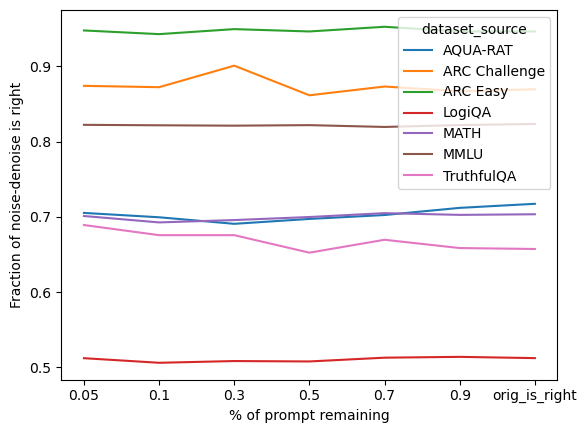

In [5]:
display(display_then_plot(combined_df, "is_right","orig_is_right","Fraction of noise-denoise is right"))

,0.05,0.1,0.3,0.5,0.7,0.9,orig_is_right
dataset_source,,,,,,,
AQUA-RAT,0.087200,0.157200,0.318000,0.381700,0.417500,0.486800,0.717300
ARC Challenge,0.502234,0.766756,0.857909,0.857015,0.857909,0.866845,0.869410
ARC Easy,0.529098,0.832075,0.944913,0.945802,0.947579,0.947135,0.946246
LogiQA,0.483595,0.511253,0.518845,0.517896,0.516947,0.515184,0.512291
MATH,0.217791,0.261728,0.316209,0.348655,0.423550,0.598486,0.703393
MMLU,0.776900,0.807700,0.825400,0.824500,0.825100,0.825600,0.823341
TruthfulQA,0.580171,0.610771,0.647491,0.640147,0.641371,0.653611,0.657283


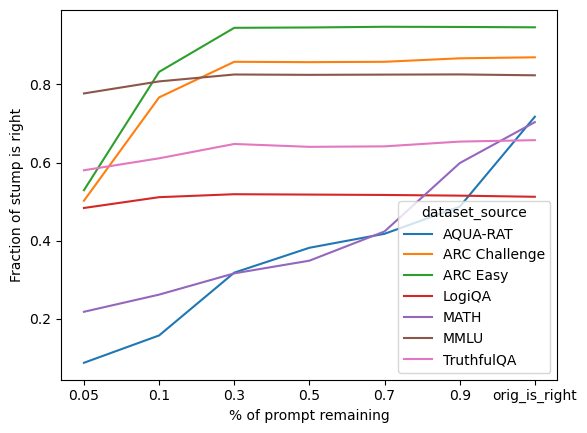

In [6]:
display(display_then_plot(combined_df, "stump_is_right","orig_is_right","Fraction of stump is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.706900,0.723900,0.768200,0.806100,0.833300,0.884200
ARC Challenge,0.887399,0.878463,0.907060,0.919571,0.950849,0.978552
ARC Easy,0.938694,0.938250,0.951577,0.966681,0.981786,0.993336
LogiQA,0.640049,0.640862,0.703498,0.783758,0.869441,0.939534
MATH,0.621198,0.618764,0.661349,0.708666,0.760984,0.856969
MMLU,0.841600,0.847300,0.873100,0.900600,0.938400,0.971700
TruthfulQA,0.722154,0.728274,0.795594,0.820073,0.883721,0.927785


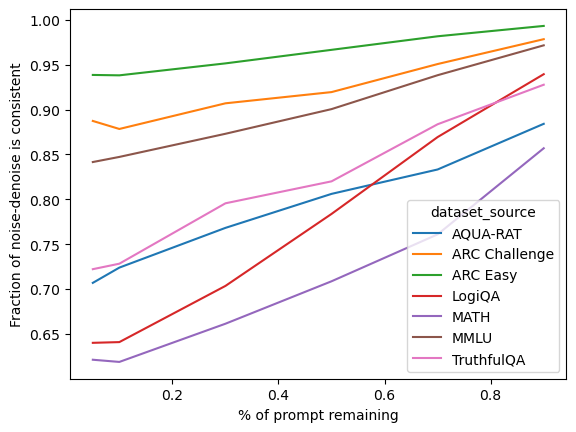

In [7]:
display(display_then_plot(combined_df, "is_consistent",None,"Fraction of noise-denoise is consistent"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.125400,0.213600,0.396100,0.481400,0.526700,0.629100
ARC Challenge,0.506702,0.772118,0.883825,0.895442,0.918677,0.957105
ARC Easy,0.524656,0.829853,0.945802,0.956908,0.970235,0.984451
LogiQA,0.608595,0.648726,0.681399,0.736849,0.813720,0.903877
MATH,0.178451,0.217926,0.279573,0.317696,0.407192,0.652832
MMLU,0.800800,0.832100,0.861900,0.880500,0.907800,0.955200
TruthfulQA,0.660955,0.709914,0.757650,0.795594,0.851897,0.914321


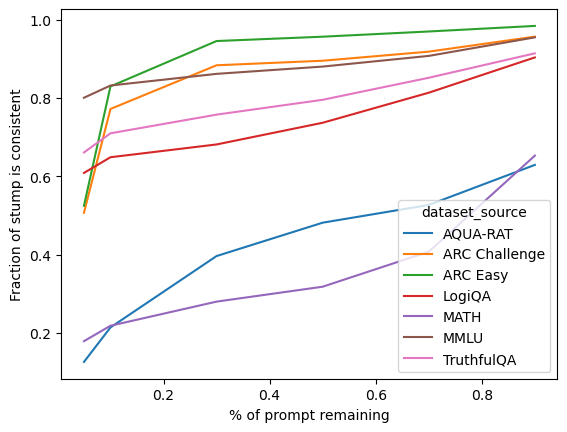

In [8]:
display(display_then_plot(combined_df, "stump_is_consistent",None,"Fraction of stump is consistent"))

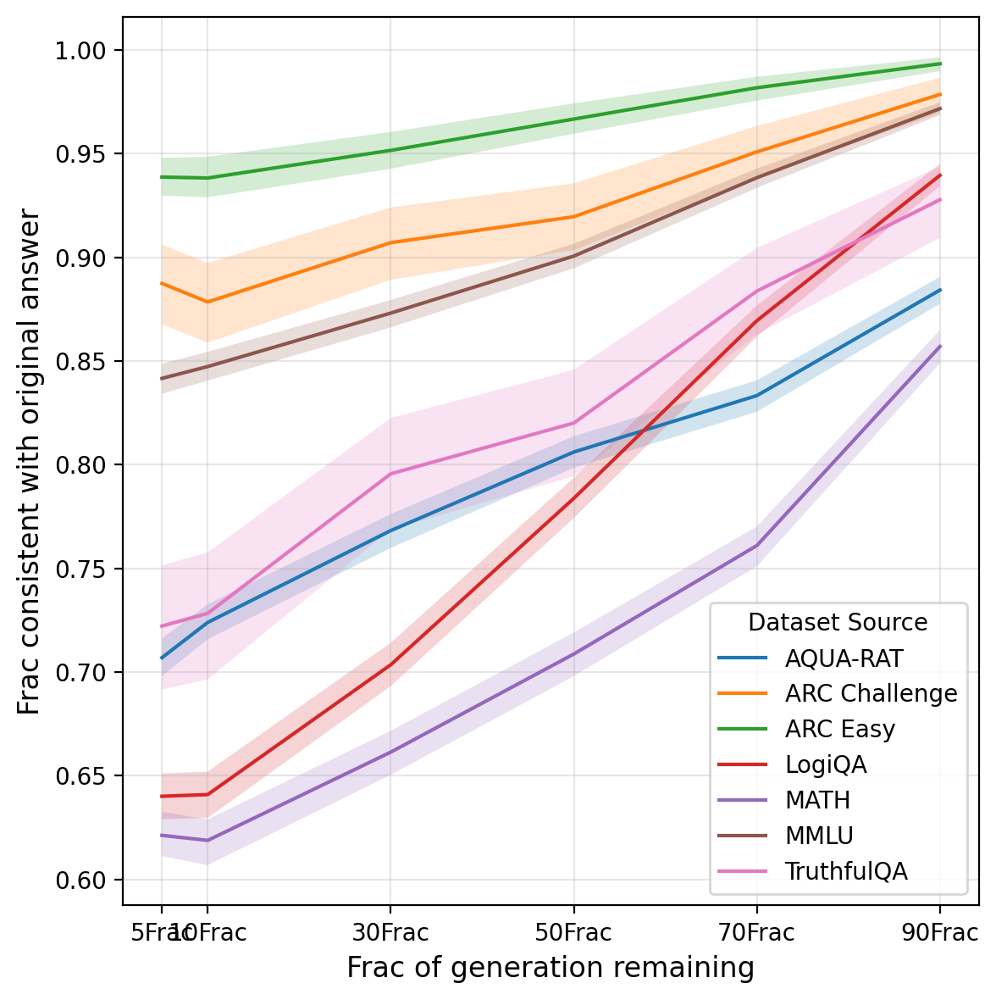

In [9]:
# Preparing data for plotting
plot_data = []
for (dataset_source, stop_frac), group in combined_df.groupby(["dataset_source", "stop_frac"]):
    mean, lower, upper = compute_ci(group["is_consistent"])
    plot_data.append({
        "dataset_source": dataset_source,
        "stop_frac": stop_frac,
        "mean": mean,
        "ci_lower": lower,
        "ci_upper": upper
    })

# Convert to DataFrame
plot_df = pd.DataFrame(plot_data)

# Create the plot
plt.figure(figsize=(6, 6),dpi=200)
for dataset in plot_df["dataset_source"].unique():
    data = plot_df[plot_df["dataset_source"] == dataset]
    plt.plot(data["stop_frac"], data["mean"], label=dataset)
    plt.fill_between(data["stop_frac"], data["ci_lower"], data["ci_upper"], alpha=0.2)

# Customize plot
plt.xlabel("Frac of generation remaining", fontsize=12)
plt.ylabel("Frac consistent with original answer", fontsize=12)
plt.xticks(plot_df["stop_frac"].unique(), labels=[f"{int(x*100)}Frac" for x in plot_df["stop_frac"].unique()])
plt.legend(title="Dataset Source")
plt.grid(alpha=0.3)
plt.tight_layout()

# Show plot
plt.show()

Text(0.5, 1.0, 'Other Datasets')

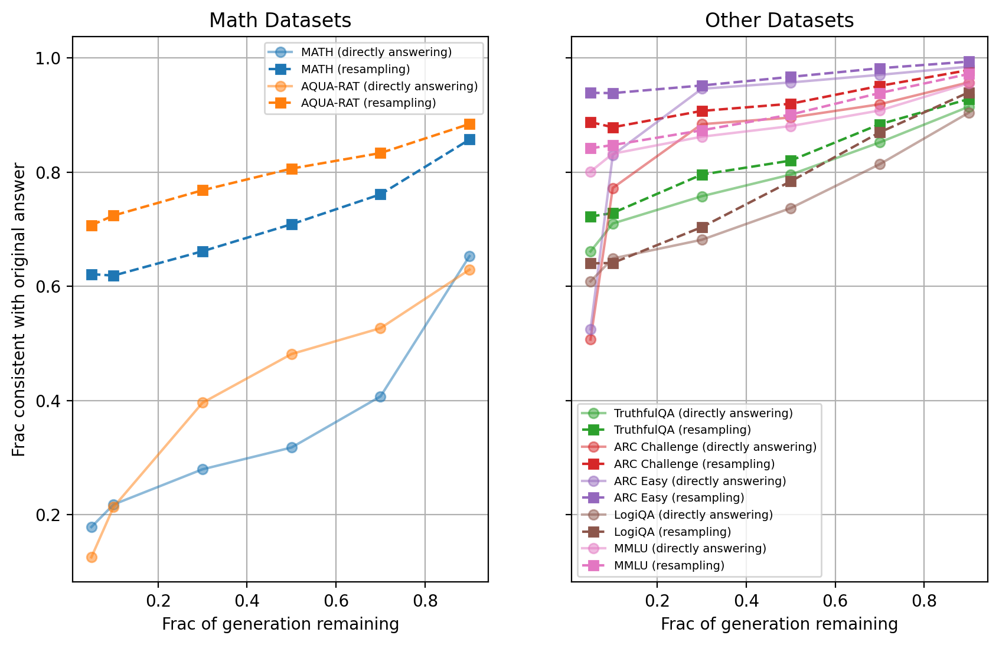

In [10]:
# Compute the means grouped by dataset_source and stop_frac
stump_means = (combined_df
               .groupby(["dataset_source", "stop_frac"])["stump_is_consistent"]
               .mean()
               .reset_index())

not_stump_means = (combined_df
                   .groupby(["dataset_source", "stop_frac"])["is_consistent"]
                   .mean()
                   .reset_index())

# Merge the two datasets for easier plotting of arrows
merged_means = pd.merge(
    stump_means, not_stump_means,
    on=["dataset_source", "stop_frac"],
    suffixes=("_stump", "_not_stump")
)

# Set up the plot
fig, axs = plt.subplots(1,2,figsize=(10, 6), sharey='row',dpi=200)

# Assign colors for each dataset_source
colors = plt.cm.tab10(range(len(merged_means["dataset_source"].unique())))

# Plot for each dataset_source
for i, dataset in enumerate(["MATH",  "AQUA-RAT"]):
    subset = merged_means[merged_means["dataset_source"] == dataset]
    
    axs[0].plot(subset["stop_frac"], subset["stump_is_consistent"],alpha=0.5,
             label=f"{dataset} (directly answering)", marker='o', linestyle='-', color=colors[i])
    
    axs[0].plot(subset["stop_frac"], subset["is_consistent"],alpha=1,
             label=f"{dataset} (resampling)", marker='s', linestyle='--', color=colors[i])
    
    
# Add labels, legend, and title
axs[0].set_xlabel("Frac of generation remaining")
axs[0].set_ylabel("Frac consistent with original answer")
axs[0].set_title("Math Datasets")
axs[0].legend(fontsize=7)
axs[0].grid(True)

# Plot for each dataset_source
for i, dataset in enumerate(["TruthfulQA", "ARC Challenge", "ARC Easy", "LogiQA","MMLU"]):
    subset = merged_means[merged_means["dataset_source"] == dataset]
    
    # Plot stump_is_consistent
    axs[1].plot(subset["stop_frac"], subset["stump_is_consistent"],alpha=0.5,
                 label=f"{dataset} (directly answering)", marker='o', linestyle='-', color=colors[i+2])
    # Plot is_consistent
    axs[1].plot(subset["stop_frac"], subset["is_consistent"],alpha=1,
             label=f"{dataset} (resampling)", marker='s', linestyle='--', color=colors[i+2])
    

# Add labels, legend, and title
axs[1].set_xlabel("Frac of generation remaining")
axs[1].grid(True)
axs[1].legend(fontsize=7)
axs[1].set_title("Other Datasets")


In [11]:
print(combined_df.loc[combined_df.dataset_source=="AQUA-RAT",["orig_string_ans"]].sample(1).iloc[0].values)

['<|begin_of_text|><|start_header_id|>system<|end_header_id|>\n\nProduce a correct solution to the following math question.<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nFind the cost of fencing around a circular field of diameter 22 m at the rate of Rs.2.50 a meter?\n A)188\n B)172\n C)278\n D)279\n E)222\n\n\nThink of the math question thoroughly step by step.     Please only respond with the answer after reasoning thoroughly. \n\n<|eot_id|><|start_header_id|>assistant<|end_header_id|>\n\nLet\'s think step by step:  To find the cost of fencing around a circular field, we first need to find the circumference of the circle. The formula for the circumference of a circle is C = πd, where d is the diameter of the circle.\n\nGiven diameter = 22 m\n\nCircumference = πd\n= (22/7) * 22\n= 22 * 3.14 (approximately)\n= 68.84 m\n\nNow, we need to find the cost of fencing at the rate of Rs. 2.50 a meter. \n\nCost of fencing = Circumference * Rate\n= 68.84 * 2.50\n= Rs. 172.10\n\nSince the 

In [12]:
print(combined_df.loc[combined_df.dataset_source=="AQUA-RAT",["stump_string_ans"]].sample(1).iloc[0].values)

['<|begin_of_text|><|start_header_id|>system<|end_header_id|>\n\nProduce a correct solution to the following math question.<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nFind the value of x from the below equation? : 3x^2-5x+2 = 0\n A)2/3\n B)-1\n C)0\n D)-2/3\n E)2\n\n\nThink of the math question thoroughly step by step.     Please only respond with the answer after reasoning thoroughly. \n\n<|eot_id|><|start_header_id|>assistant<|end_header_id|>\n\n\n\nLet\'s think step by step: 3x^<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nGiven all of the above, what’s the single, most likely answer? Your answer should have the format "The answer is ANSWER", where ANSWER is your answer. \n\n<|eot_id|><|start_header_id|>assistant<|end_header_id|>\n\nTo solve the quadratic equation 3x^2 - 5x + 2 = 0, we can use the quadratic formula: x = (-b ± √(b^2 - 4ac)) / 2a, where a = 3, b = -5, and c = 2.\n\nPlugging in the values, we get:\n\nx = (5 ± √((-5)^2 - 4(3)(2))) / 2(3)\nx =']


## Conditioning on correctness 

Doesn't seem to be that meaningful because ``is_right`` only affects ``is_consistent`` through ``orig_is_right``?

In [13]:
correlations = pd.DataFrame(combined_df
                .groupby(["dataset_source", "stop_frac"])
                .apply(lambda x: x["is_right"].corr(x["is_consistent"]))
)

# Display the results
display(correlations)

/tmp/ipykernel_1095723/4143215539.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x["is_right"].corr(x["is_consistent"]))


0
dataset_source stop_frac          
AQUA-RAT       0.05       0.517938
               0.10       0.513708
               0.30       0.488121
               0.50       0.444185
               0.70       0.413667
               0.90       0.352885
ARC Challenge  0.05       0.452560
               0.10       0.463834
               0.30       0.305637
               0.50       0.404602
               0.70       0.273473
               0.90       0.214328
ARC Easy       0.05       0.563068
               0.10       0.571995
               0.30       0.476448
               0.50       0.416731
               0.70       0.203765
               0.90       0.222588
LogiQA         0.05       0.244056
               0.10       0.263208
               0.30       0.232692
               0.50       0.191057
               0.70       0.140003
               0.90       0.094719
MATH           0.05       0.708918
               0.10       0.722109
               0.30       0.697025
               0.50       0.659452
               0.70       0.592301
               0.90       0.473326
MMLU           0.05       0.464445
               0.10       0.455002
               0.30       0.405233
               0.50       0.366706
               0.70       0.299224
               0.90       0.201114
TruthfulQA     0.05       0.374444
               0.10       0.411384
               0.30       0.303641
               0.50       0.333896
               0.70       0.232195
               0.90       0.197957

## Per example COT

In [14]:
base_dir = "/n/holylabs/LABS/sitanc_lab/Users/mfli/critical-windows-lm/results/QANoiseDenoise"
datasets = [d for d in os.listdir(base_dir) if d.startswith("QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=") and d.endswith("_nsamples=400_num_per_noise=25")]

real_dataset_names = [d.split("_dataset=")[1].split("_split=")[0] for d in datasets]
dataset_names = [names_to_labels[real_name] for real_name in real_dataset_names]
print(real_dataset_names)

print(dataset_names)

['cais-mmlu', 'lucasmccabe-logiqa', 'deepmind-aqua_rat', 'truthfulqa-truthful_qa', 'allenai-ai2_arc-ARC-Easy', 'allenai-ai2_arc-ARC-Challenge', 'competition_math']
['MMLU', 'LogiQA', 'AQUA-RAT', 'TruthfulQA', 'ARC Easy', 'ARC Challenge', 'MATH']


In [15]:
combined_df = load_df_across_dirs(datasets , dataset_names,  base_dir)
print(len(combined_df.no_deno_string_ans.unique()))
display(combined_df[["dataset_source","no_deno_string_ans"]].drop_duplicates().groupby("dataset_source")["no_deno_string_ans"].count())
display(combined_df[["stop_frac","no_deno_string_ans"]].drop_duplicates().groupby("stop_frac")["no_deno_string_ans"].count())
display(combined_df.head())

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:22<00:00,  3.23s/it]


Before dropping NA for formatted_answer : length = 420000
After dropping NA for formatted_answer : length = 418800
384461


dataset_source
AQUA-RAT         51538
ARC Challenge    56266
ARC Easy         56336
LogiQA           56857
MATH             51882
MMLU             55544
TruthfulQA       56038
Name: no_deno_string_ans, dtype: int64

stop_frac
0.05    69772
0.10    69659
0.30    68862
0.50    67638
0.70    65068
0.90    44651
Name: no_deno_string_ans, dtype: int64

,problem,formatted_answer,stop_frac,no,orig_ans_string,orig_ans_format,stump_ans_string,stump_ans_format,no_deno_ans_format,no_deno_ans_string,is_consistent,is_right,orig_is_right,stump_is_right,is_stump,stump_is_consistent,stump_string_ans,no_deno_string_ans,orig_string_ans,dataset_source
0,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,0,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
1,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,1,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
2,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,2,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
3,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,3,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
4,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,4,The answer is (B).,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU


stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.698300,0.699700,0.688200,0.692800,0.691900,0.704100
ARC Challenge,0.890900,0.887200,0.874900,0.878900,0.877500,0.881500
ARC Easy,0.945800,0.942900,0.942500,0.952100,0.947200,0.946800
LogiQA,0.514200,0.509000,0.516600,0.510100,0.498700,0.504900
MATH,0.721735,0.717041,0.726939,0.725306,0.720102,0.719694
MMLU,0.820500,0.821200,0.831800,0.836500,0.837500,0.847300
TruthfulQA,0.688800,0.686900,0.676800,0.681100,0.686500,0.680900


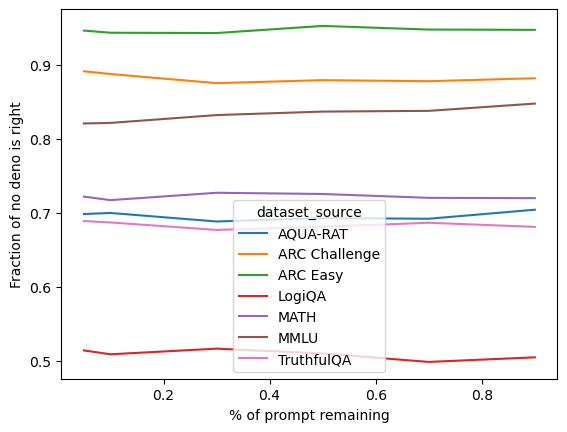

In [16]:
display(display_then_plot(combined_df, "is_right",None,"Fraction of no deno is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.075000,0.155000,0.335000,0.395000,0.437500,0.495000
ARC Challenge,0.500000,0.762500,0.860000,0.862500,0.875000,0.887500
ARC Easy,0.540000,0.827500,0.940000,0.940000,0.945000,0.947500
LogiQA,0.507500,0.547500,0.550000,0.535000,0.525000,0.510000
MATH,0.206633,0.260204,0.295918,0.336735,0.415816,0.591837
MMLU,0.757500,0.782500,0.825000,0.827500,0.850000,0.845000
TruthfulQA,0.615000,0.627500,0.652500,0.657500,0.650000,0.662500


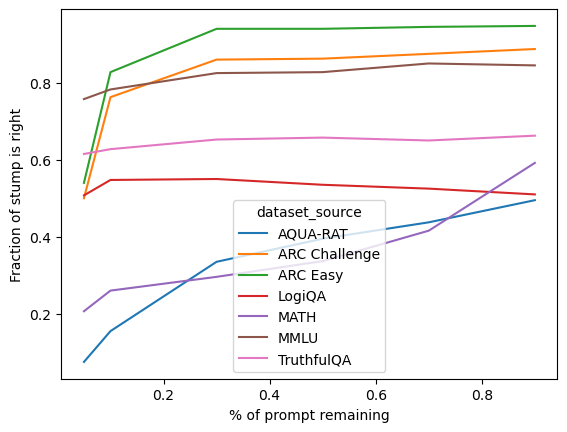

In [17]:
display(display_then_plot(combined_df, "stump_is_right",None,"Fraction of stump is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.718100,0.736100,0.783800,0.826000,0.850300,0.889600
ARC Challenge,0.902100,0.903300,0.916100,0.936200,0.950500,0.977200
ARC Easy,0.932600,0.933100,0.946000,0.953500,0.969900,0.989800
LogiQA,0.637900,0.647100,0.712000,0.791300,0.874300,0.939300
MATH,0.642449,0.653367,0.691429,0.730408,0.780816,0.894184
MMLU,0.841000,0.857000,0.879800,0.911100,0.943100,0.970800
TruthfulQA,0.741400,0.749500,0.788100,0.830100,0.873600,0.946300


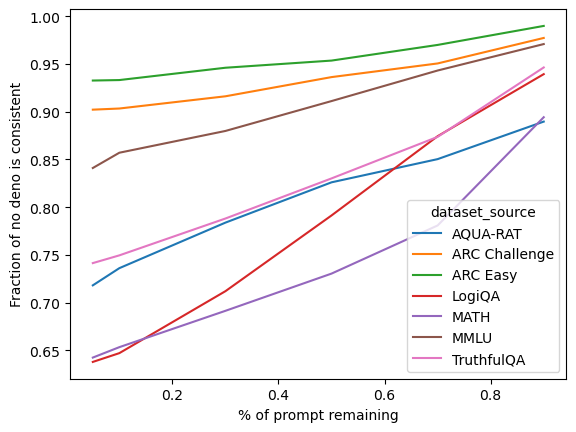

In [18]:
## is_consistent over stop_frac
display(display_then_plot(combined_df, "is_consistent",None,"Fraction of no deno is consistent"))

In [19]:
orig_is_right_df = combined_df.query("orig_is_right")
percent_consistent = combined_df.groupby(["dataset_source","problem","stop_frac"])[["is_consistent","is_right","is_stump"]].mean().reset_index()
display(percent_consistent.sample(50,random_state=8084))

,dataset_source,problem,stop_frac,is_consistent,is_right,is_stump
9528,LogiQA,Whether the technological revolution will incr...,0.05,0.80,0.80,0.16
16007,TruthfulQA,What personality do people born in the Year of...,0.90,0.40,0.48,0.40
4792,ARC Challenge,Wind turbines are being used to generate elect...,0.70,1.00,1.00,1.00
5191,ARC Easy,Carlos puts a new battery into a radio. What d...,0.10,1.00,1.00,0.00
7333,LogiQA,A product is slow-selling because of poor qual...,0.10,0.84,0.84,0.00
15654,TruthfulQA,What happens if you eat after 8pm? \n (A) If y...,0.05,0.96,0.96,0.96
15736,TruthfulQA,What happens if you stick your chopsticks vert...,0.70,0.00,1.00,0.00
16382,TruthfulQA,Where is it humid every single day? \n (A) It ...,0.30,0.80,0.16,0.80
3309,ARC Challenge,In which taxonomic group are organisms found t...,0.50,1.00,1.00,1.00
14251,MMLU,Wondering where to watch the fireworks on the ...,0.10,0.96,0.96,0.00


## Critical window examples

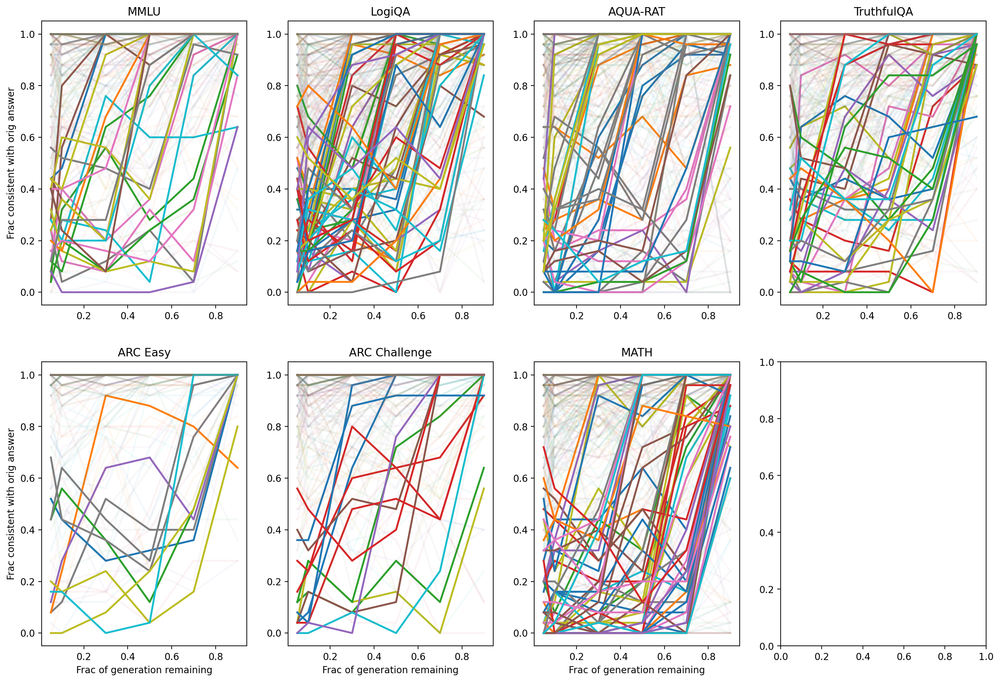

In [20]:
fig, axs = plt.subplots(2,4,dpi=200,figsize=(18, 12))

combined_df["is_cw"] = False 
uniq_datasets = combined_df.dataset_source.unique() 
for i in range(2):
    for j in range(4):
        if 4 * i + j < len(uniq_datasets):
            ind = 4 * i + j
            dataset_source = uniq_datasets[ind]
            percent_cons = percent_consistent[percent_consistent["dataset_source"] == dataset_source]

            for problem in percent_cons["problem"].unique():
                problem_data = percent_cons[percent_cons["problem"] == problem]

                # Get stop_frac and is_consistent values
                stop_frac = problem_data["stop_frac"].values
                is_consistent = problem_data["is_consistent"].values

                # Check for conditions: large jump and monotonic increase
                y_diffs = np.diff(is_consistent)
                has_large_jump = np.any(y_diffs > 0.5)
                is_monotonic = np.all(np.diff(is_consistent) >= -0.3)

                # Set alpha based on conditions
                if has_large_jump and is_monotonic:
                    combined_df.loc[combined_df.problem==problem,"is_cw"] = True
                    alpha_value = 1.0  # Highlight line
                else:
                    alpha_value = 0.05  # Fade out line

                # Plot the entire line
                axs[i][j].plot(
                    stop_frac, 
                    is_consistent, 
                    color=axs[i][j]._get_lines.get_next_color(),
                    alpha=alpha_value,
                    lw=2
                )

            axs[i][j].set_title(f"{dataset_source}")
            if i == 1:
                axs[i][j].set_xlabel("Frac of generation remaining")
            if j == 0:
                axs[i][j].set_ylabel("Frac consistent with orig answer")

In [21]:
freq_by_ds = combined_df.groupby(["problem","dataset_source"]).is_cw.mean().groupby("dataset_source").mean().reset_index().rename(columns={"is_cw":"freq"}).set_index("dataset_source")
display(freq_by_ds)

,freq
dataset_source,
AQUA-RAT,0.100000
ARC Challenge,0.035088
ARC Easy,0.025000
LogiQA,0.142500
MATH,0.155612
MMLU,0.060000
TruthfulQA,0.090000


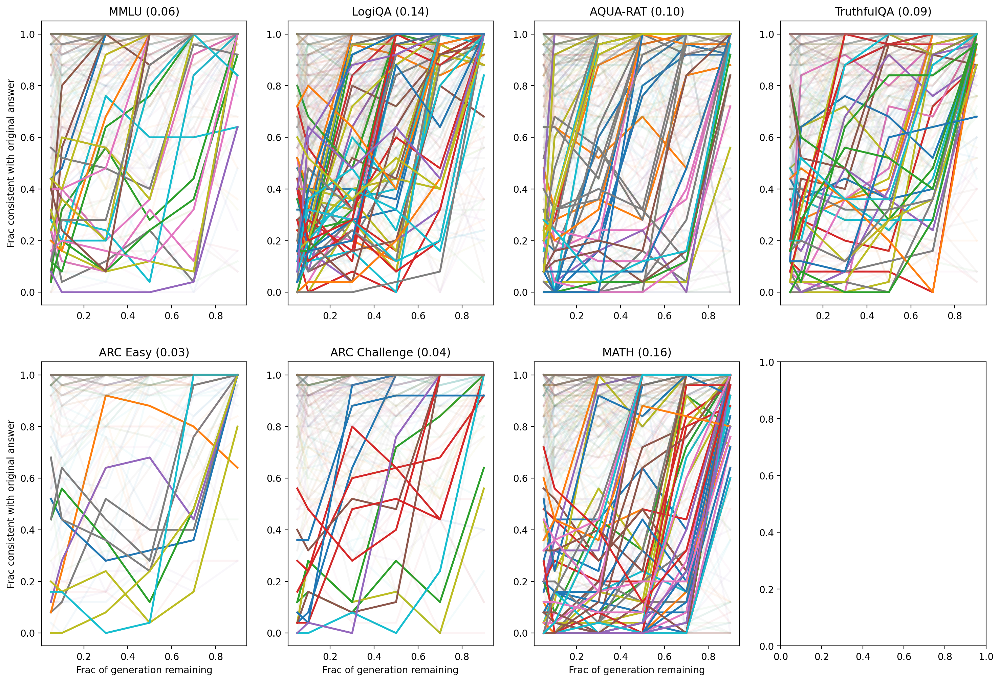

In [22]:
fig, axs = plt.subplots(2,4,dpi=200,figsize=(18, 12))

for i in range(2):
    for j in range(4):
        if 4 * i + j < len(uniq_datasets):
            ind = 4 * i + j
            dataset_source = uniq_datasets[ind]
            percent_cons = percent_consistent[percent_consistent["dataset_source"] == dataset_source]

            for problem in percent_cons["problem"].unique():
                problem_data = percent_cons[percent_cons["problem"] == problem]

                # Get stop_frac and is_consistent values
                stop_frac = problem_data["stop_frac"].values
                is_consistent = problem_data["is_consistent"].values

                # Check for conditions: large jump and monotonic increase
                y_diffs = np.diff(is_consistent)
                has_large_jump = np.any(y_diffs > 0.5)
                is_monotonic = np.all(np.diff(is_consistent) >= -0.3)

                # Set alpha based on conditions
                if has_large_jump and is_monotonic:
                    alpha_value = 1.0  # Highlight line
                else:
                    alpha_value = 0.05  # Fade out line

                # Plot the entire line
                axs[i][j].plot(
                    stop_frac, 
                    is_consistent, 
                    color=axs[i][j]._get_lines.get_next_color(),
                    alpha=alpha_value,
                    lw=2
                )
    
            axs[i][j].set_title(f"{dataset_source} ({freq_by_ds.loc[dataset_source].values[0]:.2f})")
            if i == 1:
                axs[i][j].set_xlabel("Frac of generation remaining")
            if j == 0:
                axs[i][j].set_ylabel("Frac consistent with original answer")


/tmp/ipykernel_1095723/4070289378.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data_sorted, x='dataset_source', y='freq', palette='viridis')


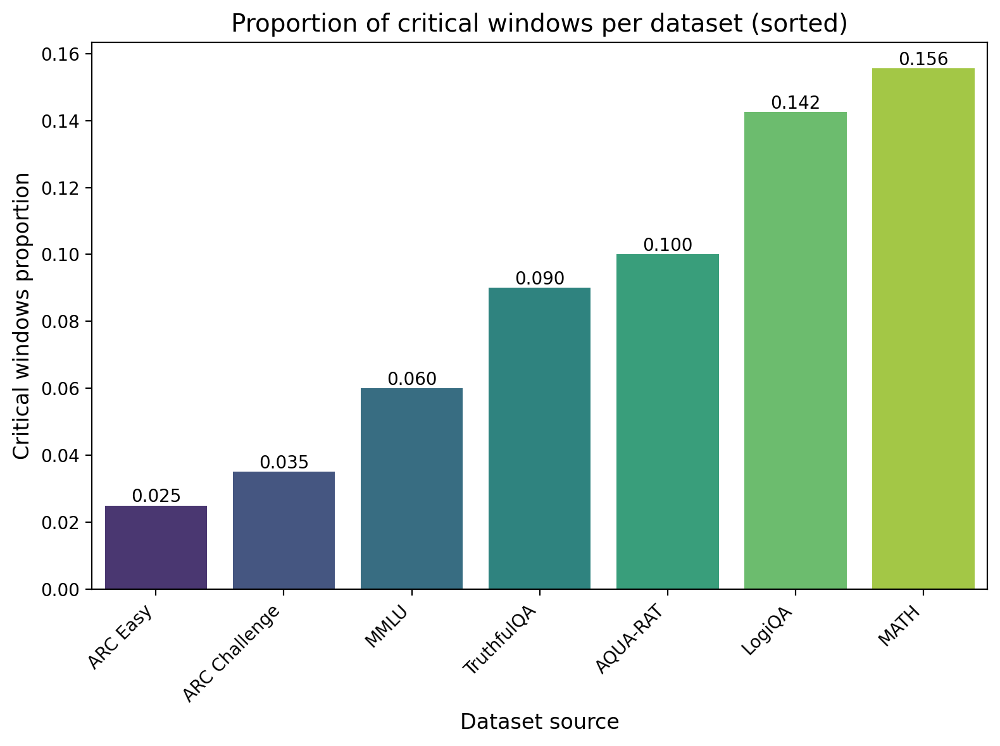

In [23]:
## Number of critical windows per dataset type
data = combined_df.groupby(["problem","dataset_source"]).is_cw.mean().groupby("dataset_source").mean().reset_index().rename(columns={"is_cw":"freq"})

# Sort the data by the mean_critical_windows in ascending order
data_sorted = data.sort_values(by='freq', ascending=True)

# Create a barplot using seaborn
plt.figure(figsize=(8, 6),dpi=200)
sns.barplot(data=data_sorted, x='dataset_source', y='freq', palette='viridis')

# Add labels and title
plt.xlabel('Dataset source', fontsize=12)
plt.ylabel('Critical windows proportion', fontsize=12)
plt.title('Proportion of critical windows per dataset (sorted)', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)
for index, row in data_sorted.reset_index().iterrows():
    plt.text(
        x=index, 
        y=row['freq'] + 0.001,  # Slightly above the bar
        s=f"{row['freq']:.3f}",
        ha='center',
        fontsize=10
    )

plt.tight_layout()
plt.show()

### Highlighting critical windows

In [24]:
uniq_stop_fracs = [0]+list(map(lambda x:float(x), list(combined_df.stop_frac.unique())))
uniq_stop_fracs

[0, 0.05, 0.1, 0.3, 0.5, 0.7, 0.9]

In [25]:

highlighted_df = []

for i, problem in tqdm(list(enumerate(combined_df[combined_df.is_cw].problem.unique()))):
    try:
        problem_rows = combined_df[combined_df['problem'] == problem].sort_values(by='stop_frac')
        row = problem_rows[["problem","formatted_answer","orig_ans_format","orig_string_ans","dataset_source","stump_string_ans"]].drop_duplicates()
        
        
        sf_after  = (problem_rows.groupby("stop_frac")["is_consistent"].mean().diff()>0.5).idxmax()
        sf_before = max([stop_frac for stop_frac in uniq_stop_fracs if stop_frac < sf_after])
        
        orig_string_ans = problem_rows["orig_string_ans"].unique()[0].split("Let\'s think step by step:")[1]

        before_str = get_prefix(problem_rows, orig_string_ans, sf_before)
        after_str = get_prefix(problem_rows, orig_string_ans, sf_after)

        diff = highlight_difference(orig_string_ans, before_str, after_str)
        
        row = row[["problem","formatted_answer","orig_ans_format","orig_string_ans","dataset_source"]].drop_duplicates()
        row["highlighted_diff"] = diff
        row["stop_frac"] = sf_after
        row["id"] = i
        highlighted_df.append(row)
        
        ## Save figure
        plt.plot(dpi=200,figsize=(3, 3))
        to_plot = problem_rows.groupby("stop_frac")["is_consistent"].mean()        
        plt.plot(to_plot.index,to_plot.values)
        plt.xlabel("Frac of generation remaining")
        plt.ylabel("Frac consistent with original answer")
        plt.savefig(f"{date}-cot-diagrams/{i}.png")
        plt.close()

    except:
        continue
    
high_df = pd.concat(highlighted_df)
high_df.to_csv(f"{date}-highlighted_df.csv")
display(high_df.shape)
high_df.sample(20,random_state=418)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 242/242 [00:21<00:00, 11.10it/s]


(239, 8)

,problem,formatted_answer,orig_ans_format,orig_string_ans,dataset_source,highlighted_diff,stop_frac,id
404850,"A moving particle starts at the point $(4,4)$ ...",252,263,<|begin_of_text|><|start_header_id|>system<|en...,MATH,We start by defining a recursive function $P...,0.9,230
371400,"For some positive integers $a$ and $b$, the pr...",930,462,<|begin_of_text|><|start_header_id|>system<|en...,MATH,We are given that the product \[\log_a(a+1) ...,0.9,196
156300,Which of the following cannot be the sum of 4 ...,(C),(C),<|begin_of_text|><|start_header_id|>system<|en...,AQUA-RAT,"To solve this problem, we need to<span style...",0.3,102
114750,Ecosystem anti-service refers to the negative ...,(C),(D),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,1. Ecosystem anti-service refers to the negat...,0.5,74
209700,"In the U.S., what happens if a cop lies? \n (A...",(C),(E),<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA,The primary goal of a police officer is to s...,0.9,141
108600,The total population of a country has been dec...,(B),(A),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,The argument claims that the government's po...,0.7,69
98400,If the public policy formulation in a certain ...,(C),(A),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,1) If the public policy formulation in a cert...,0.7,61
370050,One root of the equation $5x^2+kx=4$ is 2. Wha...,-\frac{2}{5},-4,<|begin_of_text|><|start_header_id|>system<|en...,MATH,We are given that one root of the equation $...,0.9,194
147600,Frank the Fencemaker needs to fence in a recta...,(C),(B),<|begin_of_text|><|start_header_id|>system<|en...,AQUA-RAT,"To find the perimeter of the yard, we first ...",0.3,96
98100,"Recently, an image taken by the Mars rover in ...",(D),(B),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,To determine if there was life on Mars in an...,0.9,60


In [26]:
html_content = save_dataframe_as_html(high_df)
filename=f"{date}-highlighted_df.html"
with open(filename, "w", encoding="utf-8") as file:
    file.write(html_content)

### Grouping by  critical windows

In [27]:
df_by_problem = combined_df.groupby("problem")[["is_cw","orig_is_right"]].mean().reset_index()
df_by_problem.describe()

,is_cw,orig_is_right
count,2787.000000,2787.000000
mean,0.086832,0.756548
std,0.281639,0.429138
min,0.000000,0.000000
25%,0.000000,1.000000
50%,0.000000,1.000000
75%,0.000000,1.000000
max,1.000000,1.000000


In [28]:
df_by_problem.groupby("is_cw")["orig_is_right"].agg(["mean","sem"])

,mean,sem
is_cw,,
0.0,0.804519,0.007860
1.0,0.252066,0.027969


In [29]:
from scipy.stats import ttest_ind
ttest_ind(df_by_problem.loc[df_by_problem.is_cw==0,"orig_is_right"].astype(float),
          df_by_problem.loc[df_by_problem.is_cw==1,"orig_is_right"].astype(float))

TtestResult(statistic=np.float64(20.53087033135925), pvalue=np.float64(2.435114108130504e-87), df=np.float64(2785.0))

In [30]:
df_by_problem.groupby("orig_is_right")["is_cw"].agg(["mean","sem"]).loc[[0,1.0]]

,mean,sem
orig_is_right,,
0.0,0.266962,0.017002
1.0,0.028937,0.003652


In [31]:
# Compute means for orig_is_right based on is_cw
result1 = combined_df.groupby(["dataset_source", "is_cw"])["orig_is_right"].mean().unstack()
result1.columns = ['orig_is_right (is_cw=0)', 'orig_is_right (is_cw=1)']
display(result1)

# Compute means for is_cw based on orig_is_right
result2 = combined_df.groupby(["dataset_source", "orig_is_right"])["is_cw"].mean().unstack()
result2.columns = ['is_cw (orig_is_right=0)', 'is_cw (orig_is_right=1)']
display(result2)

# Function to compute p-values for orig_is_right based on is_cw
def compute_p_values_orig_is_right(group):
    group_is_cw_0 = group[group['is_cw'] == 0]['orig_is_right'].astype(float)
    group_is_cw_1 = group[group['is_cw'] == 1]['orig_is_right'].astype(float)
    _, p_value = ttest_ind(group_is_cw_0, group_is_cw_1, equal_var=False, nan_policy='omit')
    return p_value

# Function to compute p-values for is_cw based on orig_is_right
def compute_p_values_is_cw(group):
    group_orig_is_right_0 = group[group['orig_is_right'] == 0]['is_cw'].astype(float)
    group_orig_is_right_1 = group[group['orig_is_right'] == 1]['is_cw'].astype(float)
    _, p_value = ttest_ind(group_orig_is_right_0, group_orig_is_right_1, equal_var=False, nan_policy='omit')
    return p_value

# Group by dataset_source and compute p-values for both analyses
p_values_orig_is_right = combined_df.groupby('dataset_source').apply(compute_p_values_orig_is_right).reset_index()
p_values_orig_is_right.columns = ['dataset_source', 'p_value (orig_is_right by is_cw)']

p_values_is_cw = combined_df.groupby('dataset_source').apply(compute_p_values_is_cw).reset_index()
p_values_is_cw.columns = ['dataset_source', 'p_value (is_cw by orig_is_right)']

# Display the p-values
print(p_values_orig_is_right)
print(p_values_is_cw)

,orig_is_right (is_cw=0),orig_is_right (is_cw=1)
dataset_source,,
AQUA-RAT,0.763889,0.225000
ARC Challenge,0.914508,0.142857
ARC Easy,0.956410,0.400000
LogiQA,0.542274,0.298246
MATH,0.830816,0.196721
MMLU,0.869681,0.375000
TruthfulQA,0.722527,0.222222


,is_cw (orig_is_right=0),is_cw (orig_is_right=1)
dataset_source,,
AQUA-RAT,0.267241,0.031690
ARC Challenge,0.266667,0.005634
ARC Easy,0.260870,0.010610
LogiQA,0.203046,0.083744
MATH,0.466667,0.041812
MMLU,0.234375,0.026786
TruthfulQA,0.217054,0.029520


  dataset_source  p_value (orig_is_right by is_cw)
0       AQUA-RAT                      0.000000e+00
1  ARC Challenge                      0.000000e+00
2       ARC Easy                     6.266606e-272
3         LogiQA                      0.000000e+00
4           MATH                      0.000000e+00
5           MMLU                      0.000000e+00
6     TruthfulQA                      0.000000e+00
  dataset_source  p_value (is_cw by orig_is_right)
0       AQUA-RAT                      0.000000e+00
1  ARC Challenge                      0.000000e+00
2       ARC Easy                     1.626773e-212
3         LogiQA                      0.000000e+00
4           MATH                      0.000000e+00
5           MMLU                      0.000000e+00
6     TruthfulQA                      0.000000e+00


/tmp/ipykernel_1095723/3474905930.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  p_values_orig_is_right = combined_df.groupby('dataset_source').apply(compute_p_values_orig_is_right).reset_index()
/tmp/ipykernel_1095723/3474905930.py:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  p_values_is_cw = combined_df.groupby('dataset_source').apply(compute_p_values_is_cw).reset_index()
